In [1]:
#Needed in general
import numpy as np
import matplotlib.pyplot as plt
import sys
import h5py as h5
import gc

#Quick fudge to make import from ../Scripts work
sys.path.append('../../Scripts')

#Custom imports
import ClassCOMPAS     as CC ###
# import ClassFormationChannels as FC 


# import script that has formation channel classification functions:
from PostProcessingScripts import * 
from ClassFormationChannels_5mainchannels import * 



# from matplotlib.ticker import AutoMinorLocator, MultipleLocator
# minor = AutoMinorLocator()
# import math # for tan function and degrees function

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


# Code to prepare Figure 4 
run all of them 


In [2]:
''' Below I plot the ZAMS masses of the binaries forming BHNS or NSBH showing the formation channels '''


    


def plotInitialMasses(ax, fc, Data, dictRank, dictList, channelLabelList, withinHubble=True):
    """
    ## parameters: 
    ax: axes to plot on
    fc: formationchannels function 
    Data: Data with the target binary already specified
    dictRank: dictionary of the channels & their channel nr for all metallicities
    dictList: List with the names of the channels
    channelLabelList # hack for which labels to give in legend
    withinHubble: whether to select only DCOs that merge in a Hubble time
    """
    maxM2ZAMSOLD, maxM1ZAMSOLD = 0,0
    solar=0.0142
    LowZ = solar/10.
    
    
    
    for z_ind in range(2):
        print('now at z_ind = %s, '%(z_ind))
        log10ZZsun = np.round(np.log10(Data.metallicityGrid/solar),2)
        for nrC, Channel in enumerate(dictList):
                        
#             #Get the seeds that relate to sorted indices
            seedsInterest = dictRank[Channel]
            
            #Get metallicity systems this works because seeds in both
            #files are in the same order
            mask = np.in1d(Data.seeds, np.array(seedsInterest))
            
            if withinHubble == True:
                mask = mask & (Data.Hubble == True)
            DATAmetallicities = Data.metallicitySystems[mask]

            # use the cosmic integrated weights if they exist - Coen Model
            if WeightsRateIntrinsic_zIntegrated==True:

                weight = rateIntrinsic_zIntegrated
            else:
                weight = Data.weight
            
            maskZlow = (DATAmetallicities <= LowZ)
            maskZhigh = (DATAmetallicities >LowZ)
            
            if z_ind==0:   
                M1ZAMS = Data.m1zams[mask][maskZlow]
                M2ZAMS = Data.m2zams[mask][maskZlow]
                weights= weight[mask][maskZlow]
            elif z_ind==1:
                M1ZAMS = Data.m1zams[mask][maskZhigh]
                M2ZAMS = Data.m2zams[mask][maskZhigh]
                weights= weight[mask][maskZhigh]

  
            
            if z_ind==0: # only legendlabel in one of 2 metallicity plots

                legendlabel=Channel
            else:
                legendlabel=None
            ax[z_ind].scatter((M1ZAMS),(M2ZAMS),s=weights*stimes_weight, linewidth=0.1, \
                              c=colorlist[nrC],label =legendlabel, zorder=zorderlist[Channel])

            if list(M1ZAMS):
                print( len(M1ZAMS), '= # BHNS in this sub channel')
       
     
        if z_ind==0:
            
            ax[z_ind].set_ylabel(ylabel, fontsize=fs)
            
        ax[z_ind].yaxis.set_minor_locator(AutoMinorLocator())
        ax[z_ind].xaxis.set_minor_locator(AutoMinorLocator())
        
        ax[z_ind].tick_params(labelsize=fs)
        ax[z_ind].set_xlabel(xlabel, fontsize=fs)
        
        xmin, xmax = 5,150
        ymin, ymax = 5,50
        ax[z_ind].set_xlim(xmin, xmax)
        ax[z_ind].set_ylim(ymin, ymax)  
        

        ax[z_ind].tick_params(labelsize=fs)
        

        ## Add constant mass ratio lines 
        x_q = np.linspace(5,150) # Msun, M1 range
        # plot a few fixed mass ratios:
        qlist = [5., 3.333333334, 2., 1.]
        qtextvalue=[0.2, 0.3,  0.5, 1]
        for ind_q, qvalue in enumerate(qlist):
            y_q =  x_q / qvalue
            
            
            y_text = 45 # Msun 
            if y_text*qvalue < 150:
                x_text = y_text * qvalue 
            else: 
                x_text = 141.
                y_text = x_text / qvalue
                
            # I am calculating the angle theta for the text: (see notes on this)
            delta_y = ((y_text - ymin) / (ymax-ymin)) 
            delta_x = ((x_text - xmin*qvalue) / (xmax-xmin))
            ratio = delta_y / delta_x
            theta_angle = math.degrees(math.atan((ratio)))

            ax[z_ind].plot(x_q, y_q, c='k', lw=2, linestyle =':')
            ax[z_ind].text(x_text, y_text, s=r'$q_{\rm{i}} =$ %s '%qtextvalue[ind_q], fontsize=14, \
                           horizontalalignment='center', verticalalignment='bottom', rotation=theta_angle)   
                
        
        
    

        # PLOT metallicity labels 
        if z_ind==0:
            text_Z =    r'low metallicities, '+ r'$Z_{\rm{i}} \leq Z_{\odot}/10$' # 'low metallicity \n '
        elif z_ind==1:
            text_Z =    r'high metallicities, ' + r'$Z_{\rm{i}} > Z_{\odot}/10$'  #'high metallicity \n'
        
        if PlotText == True:
            bbox_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=0.95)
            ax[z_ind].annotate(text_Z, xy=(0.5, 1.08), xycoords='axes fraction', fontsize = fs, weight = 'bold', ha='center', va="top",bbox=bbox_props)
            
        if (LOOP == True) & (z_ind==0):
            
            bbox_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=0.95)
            ax[z_ind].annotate(r'\textbf{model %s:}'%(bps_model) +'\n' + alphabetPhysicalNameDict[bps_model], xy=(0.042, .95),\
                         xycoords='axes fraction', fontsize = fs, weight = 'bold', ha='left', va="top",bbox=bbox_props,\
                        zorder=1E10)
        
        if z_ind ==0:    
            handles, labels = ax[z_ind].get_legend_handles_labels()
    
    
    return handles, labels




In [3]:


def plotInitialqVSseparation(ax, fc, Data, dictRank, dictList, withinHubble=True):
    """
    plots the initial mass ratio and separation for the binaries. 
    ## parameters: 
    ax: axes to plot on
    fc: formationchannels function 
    Data: Data with the target binary already specified
    dictRank: dictionary of the channels & their channel nr for all metallicities
    dictList: List with the names of the channels
    withinHubble: whether to select only DCOs that merge in a Hubble time
    """
    maxM2ZAMSOLD, maxM1ZAMSOLD = 0,0
    solar=0.0142
    LowZ = solar/10.
    
    for z_ind in range(2):
        print('now at z_ind = %s'%(z_ind))

        solar = 0.0142
        log10ZZsun = np.round(np.log10(Data.metallicityGrid/solar),2)
        for nrC, Channel in enumerate(dictList):
            #Get the seeds that relate to sorted indices
            seedsInterest = dictRank[Channel]
            

            #Get metallicity systems this works because seeds in both
            #files are in the same order
            mask = np.in1d(Data.seeds, np.array(seedsInterest))
            if withinHubble == True:
                mask = mask & (Data.Hubble == True)
            DATAmetallicities = Data.metallicitySystems[mask]
           
            
            # split in low and high metallicities
            maskZlow = (DATAmetallicities <= LowZ)
            maskZhigh = (DATAmetallicities > LowZ)

            
            # if wanted, use the cosmic integrated weights if they exist 
            if WeightsRateIntrinsic_zIntegrated==True:

                weight = rateIntrinsic_zIntegrated
            else:
                weight = Data.weight

            
            if z_ind==0:
                M1ZAMS = Data.m1zams[mask][maskZlow]
                M2ZAMS = Data.m2zams[mask][maskZlow]
                separationInitial = Data.separationzams[mask][maskZlow]
                weights= weight[mask][maskZlow] 
            elif z_ind==1:
                M1ZAMS = Data.m1zams[mask][maskZhigh]
                M2ZAMS = Data.m2zams[mask][maskZhigh]
                separationInitial = Data.separationzams[mask][maskZhigh]
                weights= weight[mask][maskZhigh]    
            separationInitial = np.log10(separationInitial)
            qZAMS = M2ZAMS /M1ZAMS



            if z_ind==0: # only legendlabel in one of 2 metallicity plots
                legendlabel=None
            else:
                legendlabel=None
            

            if len(weights):

                ax[z_ind].scatter(qZAMS,separationInitial,s=weights*stimes_weight, edgecolor ='', linewidth=0.1,\
                                 c=colorlist[nrC],label =legendlabel, zorder=zorderlist[Channel])
                                  

            
        if z_ind==0:  
            ax[z_ind].set_ylabel(ylabel, fontsize=fs)

        ax[z_ind].xaxis.set_minor_locator(AutoMinorLocator())
        
        ax[z_ind].tick_params(labelsize=fs)
        ax[z_ind].set_xlabel(xlabel, fontsize=fs)



        ax[z_ind].set_xlim(0, 1)
        ax[z_ind].set_ylim(-1.4, 2.3) 


        ##################
        
        
        ax[z_ind].yaxis.set_minor_locator(AutoMinorLocator())

        # ADD separation lines
        xcord_line = np.linspace(-2,3,100)
        # plot a few coordinates:
        ycordlist = [0.5, 5, 50]
        for ind_cord, ycord in enumerate(ycordlist):
            ycord_line = np.log10(ycord) * np.ones_like(xcord_line)
            ax[z_ind].plot(xcord_line, ycord_line, c='k', lw=2, linestyle =':')
            ax[z_ind].text(0.02, np.log10(ycord), s=r' %s $\rm{AU}$'%ycord, fontsize=14, \
                           horizontalalignment='left', verticalalignment='bottom', rotation=0)         
        
    
    return handles, labels


# create Figure 4

## load and prepare Data 

In [4]:
# path to hdf5 file (which I pass to the formationChannel file later)
# in this case we want to show the results for the fiducial binary population synthesis model for BHNS mergers,
# this file is called 'COMPASCompactOutput_BHNS_A.h5' and given in Zenodo. For you the path '/Volumes/Andromeda/DATA/AllDCO_bugfix/fiducial' will likely be different
# and be instead the folder where you downloaded the data
pathCOMPASOutput = '/Volumes/Andromeda/DATA/AllDCO_bugfix/fiducial/COMPASCompactOutput_BHNS_A.h5'

fdata = h5.File(pathCOMPASOutput)
print(fdata.keys())

<KeysViewHDF5 ['RLOF', 'commonEnvelopes', 'doubleCompactObjects', 'formationChannels', 'supernovae', 'systems', 'weights_detected', 'weights_detectedPerRedshift', 'weights_intrinsic', 'weights_intrinsicPerRedshift']>


In [5]:




#### Fiducial 
MODEL = 'Fiducial'




# fc = FC.FormationChannels(path = pathCOMPASOutput)
# fc.formationChannelsSeeds(types='BHNS', withinHubbleTime=True, optimistic=False)
#Based on previous notes I already now the ranks and channels


#But I want only within Hubble time 
Data            = CC.COMPASData(path=pathCOMPASOutput, lazyData=True, Mlower=5., \
                 Mupper=150., binaryFraction=1)
Data.setCOMPASDCOmask(types='BHNS',  withinHubbleTime=True, optimistic=False)
Data.setCOMPASData()
SeedsHubble    = Data.seeds[Data.Hubble==True]






weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


In [6]:

# calculate the uncertainty on the rate from poisson scatter: 
print('total weight BHNS mergers in COMPAS simulation =', np.sum(Data.weight))
rate = np.sum(Data.weight)
Nzeros = int(53*1E6 - len(Data.weight))
all_weights = np.concatenate((np.zeros(Nzeros), Data.weight))
var_rate = np.std(all_weights, ddof=1) * np.sqrt(1E6)

print('fractional uncertainty on total weight BH-NS =', var_rate/rate)
print('percentage uncertainty on total weight BH-NS =', 100*var_rate/rate, '%')

print('STROOPWAFEL gain =', len((Data.weight))/np.sum(Data.weight))

# metallicities 
DATAmetallicities = Data.metallicitySystems

# size to multiply the scatterpoint area with
stimes_weight = 200


total weight BHNS mergers in COMPAS simulation = 23174.234060106566
fractional uncertainty on total weight BH-NS = 0.00025328472928200175
percentage uncertainty on total weight BH-NS = 0.025328472928200178 %
STROOPWAFEL gain = 65.82970535480061


# calculate the formation channels that the BH-NS form through. 

In [7]:
# obtain the seeds of the BHNS for each channel

seedsPercentageClassic, seedsPercentageOnlyStableMT = returnSeedsPercentageClassicAndOnlyStableMT(pathCOMPASOutput=pathCOMPASOutput,\
                                types='BHNS',  withinHubbleTime=True, optimistic=False, \
                                binaryFraction=1)
seedsClassic, percentageClassic = seedsPercentageClassic
seedsOnlyStableMT, percentageOnlyStableMT = seedsPercentageOnlyStableMT



seedsDoubleCE, percentageDoubleCE = returnSeedsPercentageDoubleCoreCEE(pathCOMPASOutput=pathCOMPASOutput,\
                                types='BHNS',  withinHubbleTime=True, optimistic=False, \
                                binaryFraction=1)


seedsSingleCE, percentageSingleCE = returnSeedsPercentageSingleCoreCEE(pathCOMPASOutput=pathCOMPASOutput,\
                                types='BHNS',  withinHubbleTime=True, optimistic=False, \
                                binaryFraction=1)



seedschannels = [seedsClassic, seedsOnlyStableMT, seedsSingleCE, seedsDoubleCE]

seedsOther, percentageOther = returnSeedsPercentageOther(pathCOMPASOutput=pathCOMPASOutput,\
                                types='BHNS',  withinHubbleTime=True, optimistic=False, \
                                binaryFraction=1, channelsSeedsList=seedschannels)




dictChannelsBHNS = { 'classic':seedsClassic, \
                    'immediate CE':seedsSingleCE,\
                         'stable B no CEE':seedsOnlyStableMT, \
                     r'double-core CE':seedsDoubleCE,  \
                        'other':seedsOther\
                       }


dictPercentages = { 'classic':percentageClassic, \
                    'immediate CE':percentageSingleCE,\
                         'stable B no CEE':percentageOnlyStableMT, \
                     r'double-core CE':percentageDoubleCE,  \
                        'other':percentageOther\
                       } 

weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  65.18201235140664
percentage Only stable MT =   5.081141190979925
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 3.36936747652693
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 19.67088471620494
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  6.696594264881554


In [8]:
# prepare legend label:


legendlabel = []
for ind, key in enumerate(dictChannelsBHNSList):
    
    print(str((round(dictPercentages[key],2))) + str(r'\%'))
    string = dictChannelsBHNSListBolt[ind] #+# ' '# + r'$%s$'%str((roundAndFormat1(dictPercentages[key]))) + str(r'\%')
    print(string)
    legendlabel.append(string)
    
    


65.18\%
\textbf{(I) Classic}
5.08\%
\textbf{(II) Only stable mass transfer}
19.67\%
\textbf{(III) Single-core CE as first mass transfer}
3.37\%
\textbf{(IV) Double-core CE as first mass transfer}
6.7\%
\textbf{(V) Other}


## Plot the figure from the data  

-----------------
now doing initial masses (top panels)
-----------------
now at z_ind = 0, 
189491 = # BHNS in this sub channel
5957 = # BHNS in this sub channel
23420 = # BHNS in this sub channel
4964 = # BHNS in this sub channel
5505 = # BHNS in this sub channel
now at z_ind = 1, 
1241276 = # BHNS in this sub channel
4749 = # BHNS in this sub channel
41057 = # BHNS in this sub channel
5031 = # BHNS in this sub channel
4103 = # BHNS in this sub channel
-----------------
now doing q vs separation (bottom panels)
-----------------
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


-----------------
now drawing arrows
-----------------


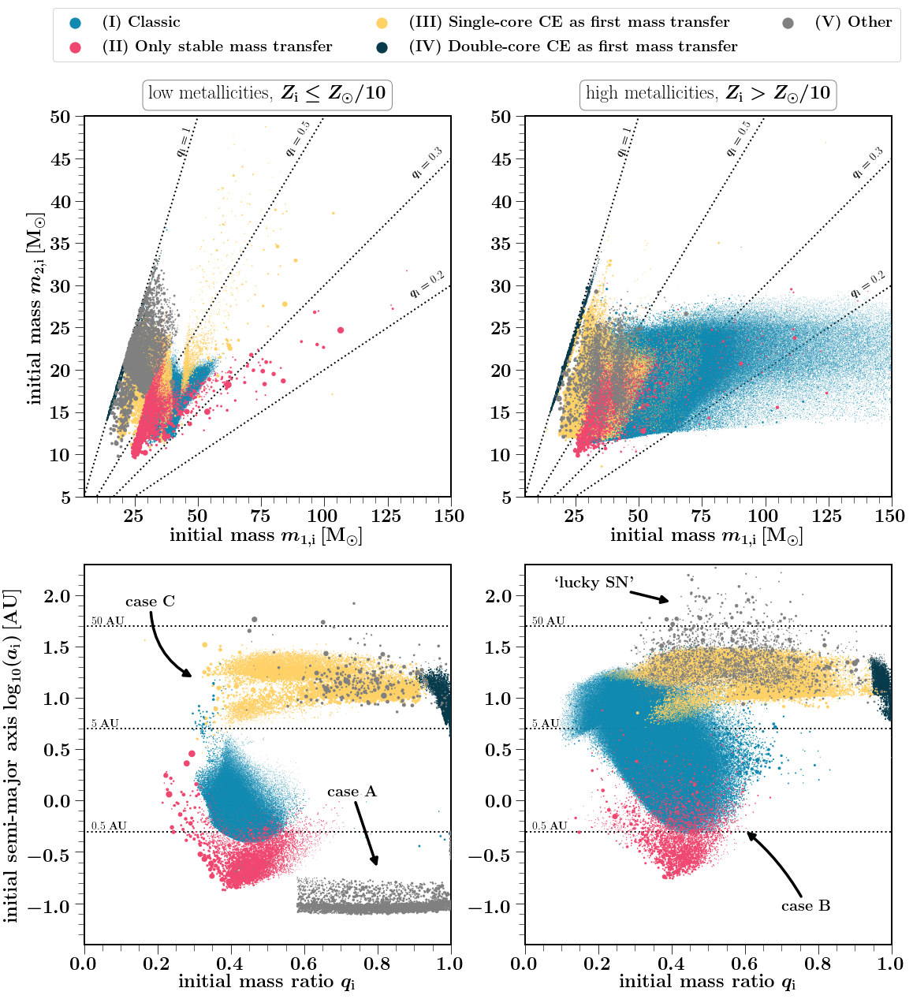

In [9]:


LOOP = False

# Use MSSFR Integrated weights?
WeightsRateIntrinsic_zIntegrated=False
if WeightsRateIntrinsic_zIntegrated==False:
    ModelName = 'notMSSFRweighted'

# multiply weights with this no to obtain scatter point area size
stimes_weight = 25

metallicities = [0.0014,  0.01269]


print('-----------------')
print('now doing initial masses (top panels)')
print('-----------------')

f, ax= plt.subplots(ncols=2,nrows=2, figsize=(16,16), 
                  gridspec_kw={"width_ratios":[1.5, 1.5]})




#### PLOT SEPARATION AND MASS RATIO ###
xlabel = r'\textbf{initial mass} $m_{1,{\rm{i}}} \, [\rm{M}_{\odot}]$'
ylabel = r'\textbf{initial mass} $m_{2,{\rm{i}}} \, [\rm{M}_{\odot}]$'


PlotText = True
fc=None

handles, labels = plotInitialMasses(ax=ax[0], fc=fc, Data=Data\
                  , dictRank=dictChannelsBHNS, dictList=dictChannelsBHNSList,channelLabelList=range(8), withinHubble=True)

lgd2 = f.legend(handles, legendlabel, fontsize=20, ncol=3,\
         bbox_to_anchor=(1.0, 1.1),  markerscale=3., scatterpoints=1) # loc = 'upper center')






markersize_lgd = 200
lgd2.legendHandles[0]._sizes = [markersize_lgd]
lgd2.legendHandles[1]._sizes = [markersize_lgd]
lgd2.legendHandles[2]._sizes = [markersize_lgd]
lgd2.legendHandles[3]._sizes = [markersize_lgd]
lgd2.legendHandles[4]._sizes = [markersize_lgd]



xlabel = r'\textbf{initial mass ratio} $q_{\rm{i}} $'
ylabel = r'\textbf{initial semi-major axis} $\log_{10}(a_{\rm{i}}) \, [\rm{AU}]$'

print('-----------------')
print('now doing q vs separation (bottom panels)')
print('-----------------')


# whether to plot labels text
PlotText = False
handles, labels = plotInitialqVSseparation(ax=ax[1], fc=fc, Data=Data\
                  , dictRank=dictChannelsBHNS, dictList=dictChannelsBHNSList, withinHubble=True)




##### ADD ARROWS ####

print('-----------------')
print('now drawing arrows')
print('-----------------')


# properties  arrow 
strr = r"\textbf{case A} "
x_xy, y_xy = 0.8, 0.2
x_xytext, y_xytext = 0.8, 0.4
conn = "arc3,rad=+0.0"

# draw arrow
ax[1,0].annotate(strr,
  xy=(x_xy, y_xy), xycoords='axes fraction',
  xytext=(x_xytext, y_xytext), textcoords='axes fraction',
  size=20, va="center", ha="right",
  arrowprops=dict(arrowstyle="-|>",
                  connectionstyle=conn,
                  fc="k", lw=3.5), zorder=20000)



# properties  arrow 
strr = r"\textbf{case C} "
x_xy, y_xy = 0.3, 0.7
x_xytext, y_xytext = 0.25, 0.9
conn = "arc3,rad=+0.3"

# draw arrow
ax[1,0].annotate(strr,
  xy=(x_xy, y_xy), xycoords='axes fraction',
  xytext=(x_xytext, y_xytext), textcoords='axes fraction',
  size=20, va="center", ha="right",
  arrowprops=dict(arrowstyle="-|>",
                  connectionstyle=conn,
                  fc="k", lw=3.5), zorder=20000)

# properties arrow 
strr = r"\textbf{case B} "
x_xy, y_xy = 0.6, 0.3
x_xytext, y_xytext = 0.7, 0.1
conn = "arc3,rad=+0.1"

# draw arrow redshift
ax[1,1].annotate(strr,
  xy=(x_xy, y_xy), xycoords='axes fraction',
  xytext=(x_xytext, y_xytext), textcoords='axes fraction',
  size=20, va="center", ha="left",
  arrowprops=dict(arrowstyle="-|>",
                  connectionstyle=conn,
                  fc="k", lw=3.5), zorder=20000)


# properties arrow 
strr = r"\textbf{`lucky SN'} "
x_xy, y_xy = 0.4, 0.9
x_xytext, y_xytext = 0.3, 0.95
conn = "arc3,rad=+0.0"
# draw arrow 
ax[1,1].annotate(strr,
  xy=(x_xy, y_xy), xycoords='axes fraction',
  xytext=(x_xytext, y_xytext), textcoords='axes fraction',
  size=20, va="center", ha="right",
  arrowprops=dict(arrowstyle="-|>",
                  connectionstyle=conn,
                  fc="k", lw=3.5), zorder=20000)

#########
#####  ####

# save and show 
f.tight_layout(pad=0.4, w_pad=0.5, h_pad=0.5) 
f.savefig('./BHNS_InitialParameters_'+ ModelName + '.png', bbox_extra_artists=(lgd2,), bbox_inches='tight', dpi = 600)
plt.show()
plt.close()        



### Code used to play around with positions of arrows:

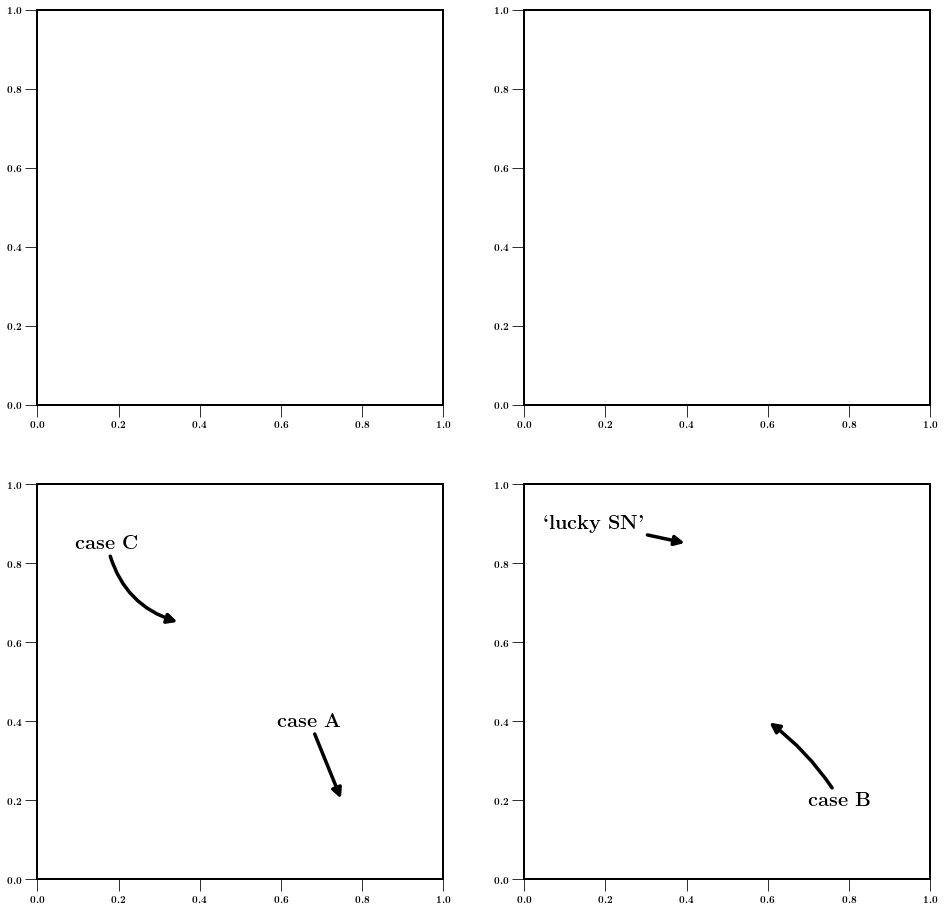

In [10]:

f, ax= plt.subplots(ncols=2,nrows=2, figsize=(16,16), 
                  gridspec_kw={"width_ratios":[1.5, 1.5]})


# properties  arrow 
strr = r"\textbf{case A} "
x_xy, y_xy = 0.75, 0.2
x_xytext, y_xytext = 0.75, 0.4
conn = "arc3,rad=+0.0"

# draw arrow
ax[1,0].annotate(strr,
  xy=(x_xy, y_xy), xycoords='axes fraction',
  xytext=(x_xytext, y_xytext), textcoords='axes fraction',
  size=20, va="center", ha="right",
  arrowprops=dict(arrowstyle="-|>",
                  connectionstyle=conn,
                  fc="k", lw=3.5), zorder=20000)



# properties  arrow 
strr = r"\textbf{case C} "
x_xy, y_xy = 0.35, 0.65
x_xytext, y_xytext = 0.25, 0.85
conn = "arc3,rad=+0.3"

# draw arrow
ax[1,0].annotate(strr,
  xy=(x_xy, y_xy), xycoords='axes fraction',
  xytext=(x_xytext, y_xytext), textcoords='axes fraction',
  size=20, va="center", ha="right",
  arrowprops=dict(arrowstyle="-|>",
                  connectionstyle=conn,
                  fc="k", lw=3.5), zorder=20000)





# properties arrow 
strr = r"\textbf{case B} "
x_xy, y_xy = 0.6, 0.4
x_xytext, y_xytext = 0.7, 0.2
conn = "arc3,rad=+0.1"

# draw arrow redshift
ax[1,1].annotate(strr,
  xy=(x_xy, y_xy), xycoords='axes fraction',
  xytext=(x_xytext, y_xytext), textcoords='axes fraction',
  size=20, va="center", ha="left",
  arrowprops=dict(arrowstyle="-|>",
                  connectionstyle=conn,
                  fc="k", lw=3.5), zorder=20000)


# properties arrow 
strr = r"\textbf{`lucky SN'} "
x_xy, y_xy = 0.4, 0.85
x_xytext, y_xytext = 0.3, 0.9
conn = "arc3,rad=+0.0"

# draw arrow 
ax[1,1].annotate(strr,
  xy=(x_xy, y_xy), xycoords='axes fraction',
  xytext=(x_xytext, y_xytext), textcoords='axes fraction',
  size=20, va="center", ha="right",
  arrowprops=dict(arrowstyle="-|>",
                  connectionstyle=conn,
                  fc="k", lw=3.5), zorder=20000)



plt.show()

# Make additional figures for online supplementary 

In [11]:
import string

# some label lists for different models 
nModels=15
BPSnameslist = list(string.ascii_uppercase)[0:nModels]
# I put every data file in an own directory, with the following names: 
modelDirList = ['fiducial', 'massTransferEfficiencyFixed_0_25', 'massTransferEfficiencyFixed_0_5', 'massTransferEfficiencyFixed_0_75', \
               'unstableCaseBB', 'alpha0_5', 'alpha2_0', 'fiducial', 'rapid', 'maxNSmass2_0', 'maxNSmass3_0', 'noPISN',  'ccSNkick_100km_s', 'ccSNkick_30km_s', 'noBHkick' ]

alphabetDirDict =  {BPSnameslist[i]: modelDirList[i] for i in range(len(BPSnameslist))}


physicalNamesBPSmodels = [r'\textbf{fiducial}',\
                           r'$\beta=0.25$', r'$\beta=0.5$',  r'$\beta=0.75$',r'\textbf{unstable case BB}',\
                           r'$\alpha_{\rm{CE}}=0.5$',  r'$\alpha_{\rm{CE}}=2$', r'\textbf{optimistic CE}',\
                          r'\textbf{rapid SN}', r'$\rm{max} \ m_{\rm{NS}}=2.0\,\rm{M}_{\odot}$', r'$\rm{max} \ m_{\rm{NS}}=3.0\,\rm{M}_{\odot}$',\
                          r'\textbf{no PISN}', r'\textbf{SN} '+ r'$\sigma_{\rm{cc}}=100\,\rm{km}\,\rm{s}^{-1}$',r'\textbf{SN} '+ r'$\sigma_{\rm{cc}}=30\,\rm{km}\,\rm{s}^{-1}$',\
                          r'\textbf{SN} '+ r'$v_{\rm{k,BH}}=0\,\rm{km}\,\rm{s}^{-1}$' ]



alphabetPhysicalNameDict =  {BPSnameslist[i]: physicalNamesBPSmodels[i] for i in range(len(BPSnameslist))}

## Loop over all binary population synthesis models: 

In [13]:
print(pathCOMPASOutput)

/Volumes/Andromeda/DATA/AllDCO_bugfix/fiducial/COMPASCompactOutput_BHNS_A.h5



-----------------
now doing BPS model A, fiducial
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


RuntimeError: Can't decrement id ref count (file write failed: time = Mon Feb  8 18:04:32 2021
, filename = '/Volumes/Andromeda/DATA/AllDCO_bugfix/unstableCaseBB/COMPASCompactOutput_BHNS_E.h5', file descriptor = 58, errno = 5, error message = 'Input/output error', buf = 0x7f84ba74eff8, total write size = 96, bytes this sub-write = 96, bytes actually written = 18446744073709551615, offset = 0)

Exception ignored in: 'h5py._objects.ObjectID.__dealloc__'
Traceback (most recent call last):
  File "h5py/_objects.pyx", line 193, in h5py._objects.ObjectID.__dealloc__
RuntimeError: Can't decrement id ref count (file write failed: time = Mon Feb  8 18:04:32 2021
, filename = '/Volumes/Andromeda/DATA/AllDCO_bugfix/unstableCaseBB/COMPASCompactOutput_BHNS_E.h5', file descriptor = 58, errno = 5, error message = 'Input/output error', buf = 0x7f84ba74eff8, total write size = 96, bytes this sub-write = 96, bytes actually written = 18446744073709551615, offset = 0)


total weight BHNS mergers in COMPAS simulation = 23174.234060106566
fractional uncertainty on total weight BH-NS = 0.00025328472928200175
percentage uncertainty on total weight BH-NS = 0.025328472928200178 %
STROOPWAFEL gain = 65.82970535480061
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  65.18201235140664
percentage Only stable MT =   5.081141190979925
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 3.36936747652693
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 19.67088471620494
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  6.696594264881554
now making figure
now at z_ind = 0, 
189491 = # BHNS in this sub channel
5957 = # BHNS in this sub channel
23420 = # BHNS in this sub channel
4964 = # BHNS in this sub channel
5505 = # BHNS in this sub channel
now at z_ind = 1, 
1241276 = # BHNS in this sub channel
4749 = # BHNS in this sub channel
41057 = # BHNS in this sub channel
5031 = # BHNS in this sub channel
4103 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


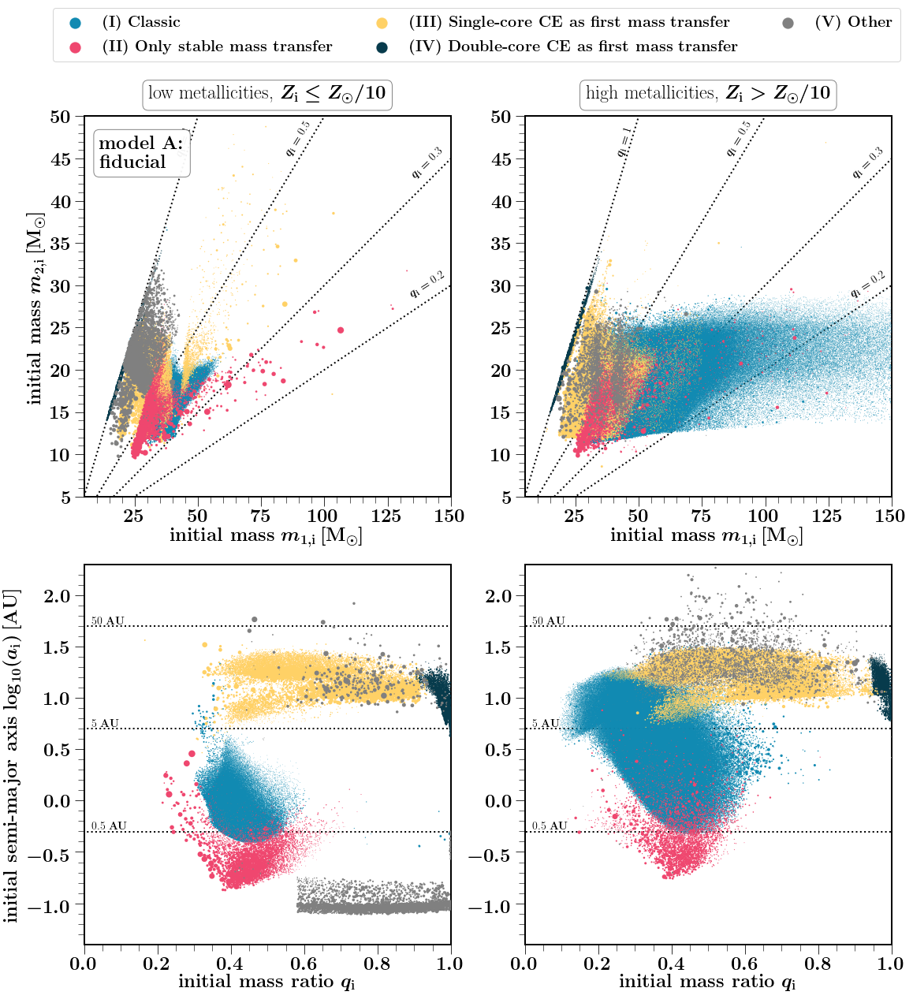

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model B, massTransferEfficiencyFixed_0_25
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 15581.352363435695
fractional uncertainty on total weight BH-NS = 0.00035310477755190695
percentage uncertainty on total weight BH-NS = 0.035310477755190695 %
STROOPWAFEL gain = 47.39877404564081
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  56.83293974289229
percentage Only stable MT =   16.867928898491922
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 0.0
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 18.809073016153917
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  7.490058342461821
now making figure
now at z_ind = 0, 
119109 = # BHNS in this sub channel
10855 = # BHNS in this sub channel
11781 = # BHNS in this sub channel
2632 = # BHNS in this sub channel
now at z_ind = 1, 
542121 = # BHNS in this sub channel
15480 = # BHNS in this sub channel
30181 = # BHNS in this sub channel
6378 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


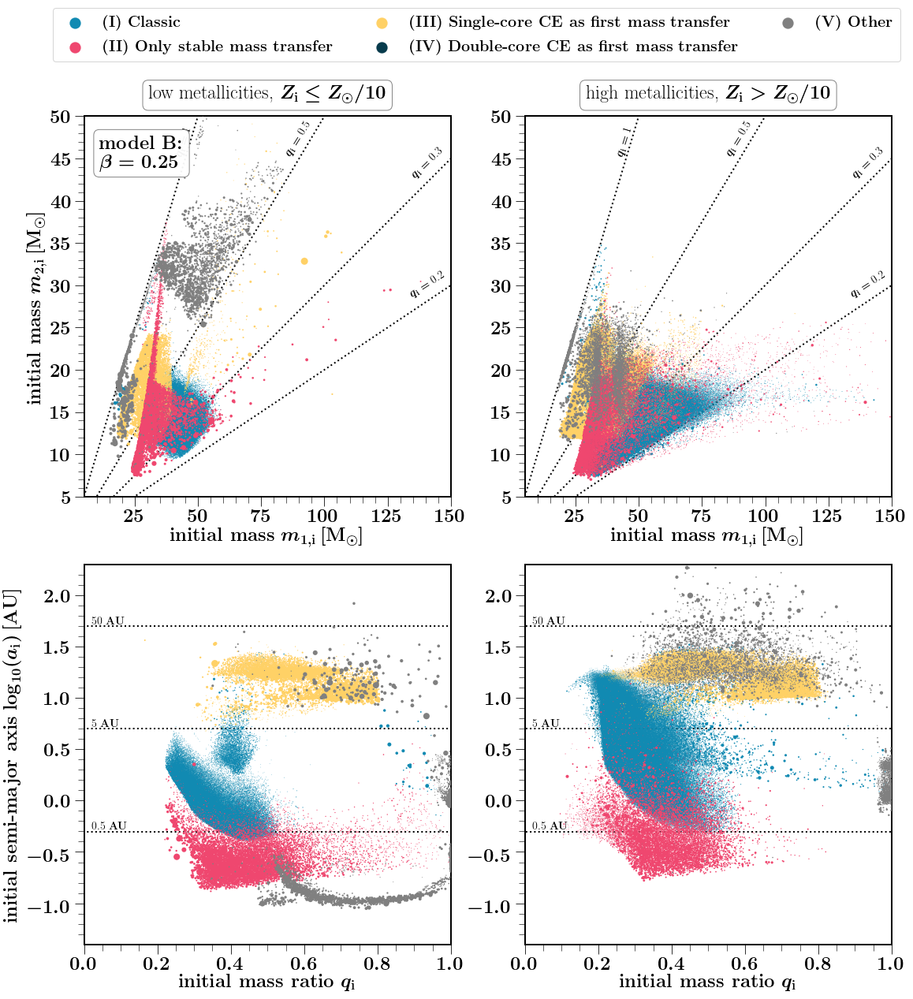

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model C, massTransferEfficiencyFixed_0_5
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 8435.329993980213
fractional uncertainty on total weight BH-NS = 0.0005444441963926363
percentage uncertainty on total weight BH-NS = 0.05444441963926363 %
STROOPWAFEL gain = 17.550350739763516
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  6.835011453175686
percentage Only stable MT =   33.917867112518145
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 0.0
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 43.56882666961972
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  15.678294764686463
now making figure
now at z_ind = 0, 
5089 = # BHNS in this sub channel
22754 = # BHNS in this sub channel
19291 = # BHNS in this sub channel
3874 = # BHNS in this sub channel
now at z_ind = 1, 
10232 = # BHNS in this sub channel
29007 = # BHNS in this sub channel
49789 = # BHNS in this sub channel
8007 = # BHNS in this sub channel
now at z_ind = 0
now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


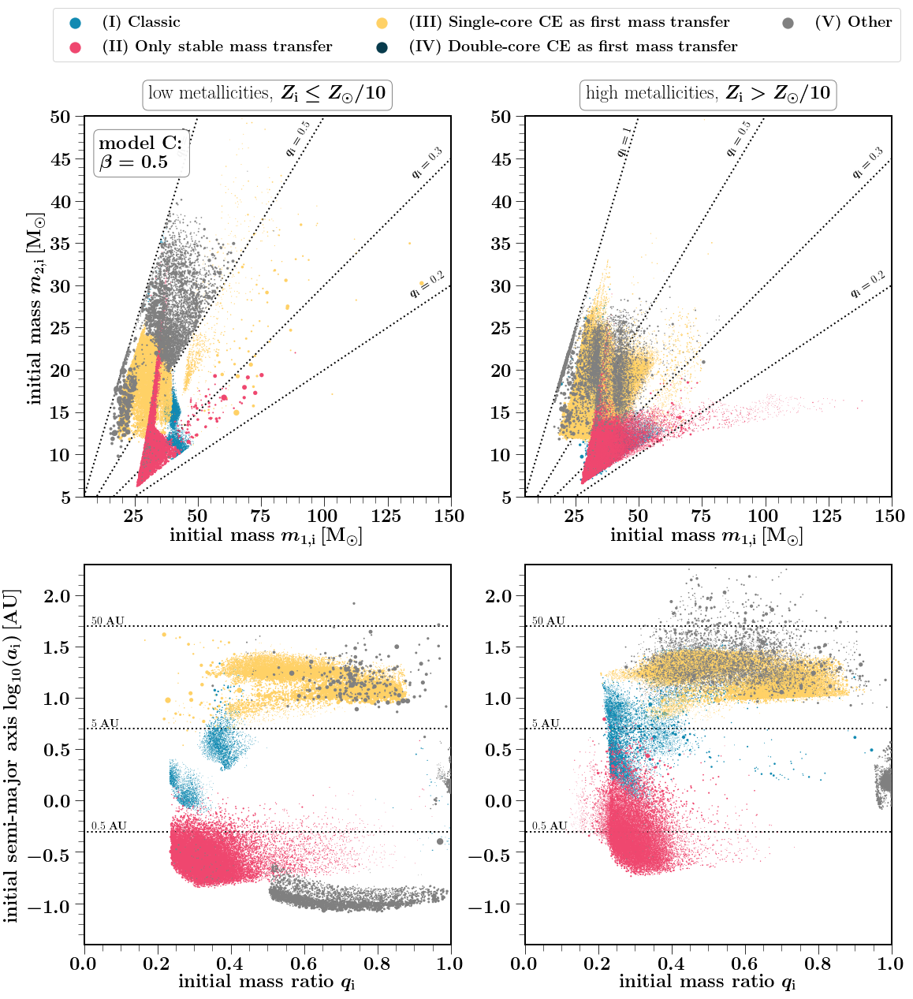

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model D, massTransferEfficiencyFixed_0_75
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 6657.200807904439
fractional uncertainty on total weight BH-NS = 0.000645097979675754
percentage uncertainty on total weight BH-NS = 0.0645097979675754 %
STROOPWAFEL gain = 17.86351402511382
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  2.1513630345306587
percentage Only stable MT =   8.472031472452628
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 2.568973627221621
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 63.926542619582335
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  22.881089246212746
now making figure
now at z_ind = 0, 
1032 = # BHNS in this sub channel
10474 = # BHNS in this sub channel
28698 = # BHNS in this sub channel
114 = # BHNS in this sub channel
6938 = # BHNS in this sub channel
now at z_ind = 1, 
1566 = # BHNS in this sub channel
2383 = # BHNS in this sub channel
59400 = # BHNS in this sub channel
2562 = # BHNS in this sub channel
5754 = # BHNS in this sub channel
now at z_ind = 0
now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


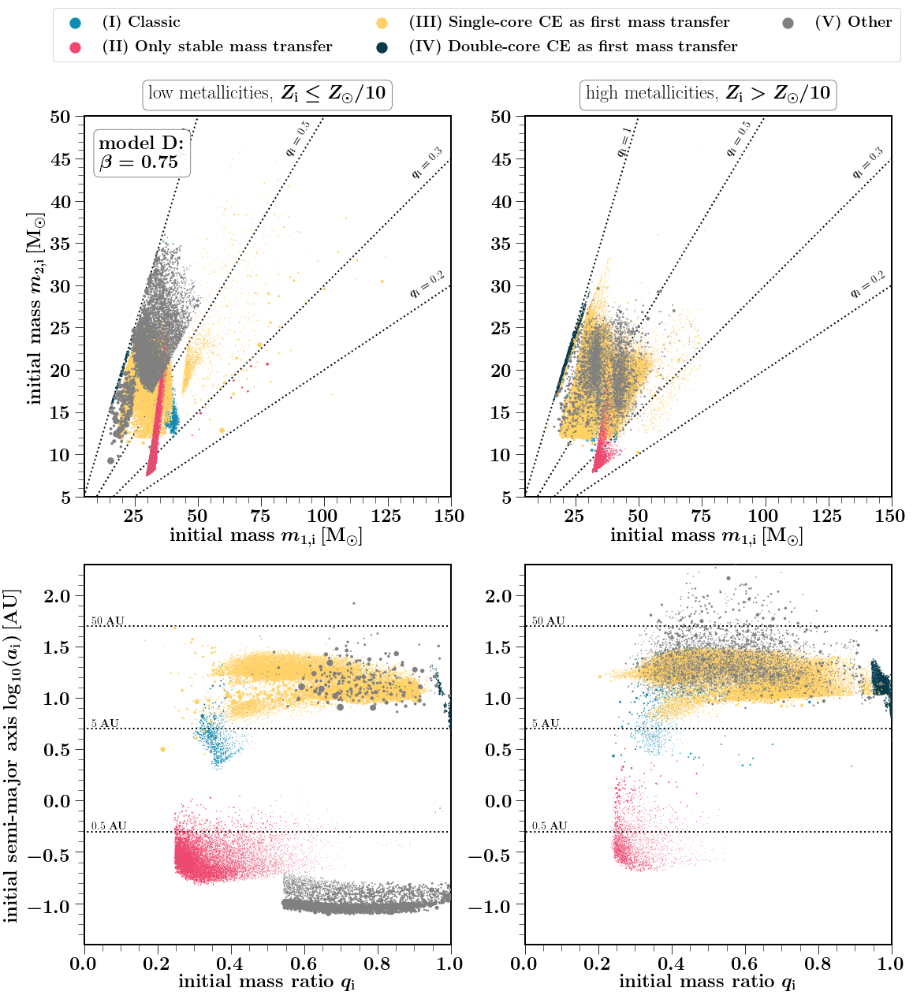

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model E, unstableCaseBB
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 5825.056319597468
fractional uncertainty on total weight BH-NS = 0.0006031100657615814
percentage uncertainty on total weight BH-NS = 0.06031100657615815 %
STROOPWAFEL gain = 78.74035457080277
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  62.089040588429
percentage Only stable MT =   8.107679408214143
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 0.3968610028026583
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 21.535656919692396
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  7.8707620808617555
now making figure
now at z_ind = 0, 
37626 = # BHNS in this sub channel
1437 = # BHNS in this sub channel
4552 = # BHNS in this sub channel
61 = # BHNS in this sub channel
1020 = # BHNS in this sub channel
now at z_ind = 1, 
396878 = # BHNS in this sub channel
2332 = # BHNS in this sub channel
12557 = # BHNS in this sub channel
58 = # BHNS in this sub channel
2146 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


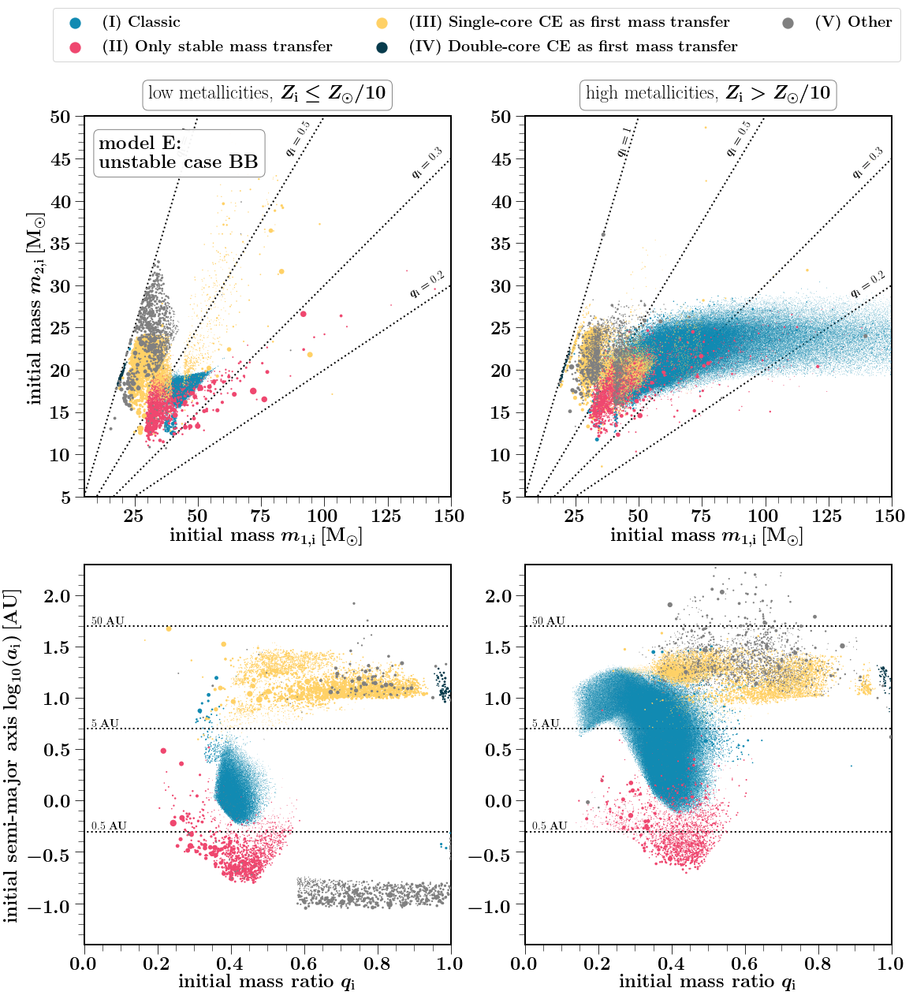

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model F, alpha0_5
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 10382.713215089176
fractional uncertainty on total weight BH-NS = 0.0004065638956930716
percentage uncertainty on total weight BH-NS = 0.04065638956930716 %
STROOPWAFEL gain = 88.14449374080489
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  60.2579557336116
percentage Only stable MT =   10.509400410845126
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 0.4757809257907919
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 20.96713282466527
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  7.789730105087249
now making figure
now at z_ind = 0, 
51916 = # BHNS in this sub channel
5118 = # BHNS in this sub channel
10229 = # BHNS in this sub channel
51 = # BHNS in this sub channel
1723 = # BHNS in this sub channel
now at z_ind = 1, 
809579 = # BHNS in this sub channel
4444 = # BHNS in this sub channel
27179 = # BHNS in this sub channel
151 = # BHNS in this sub channel
4789 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


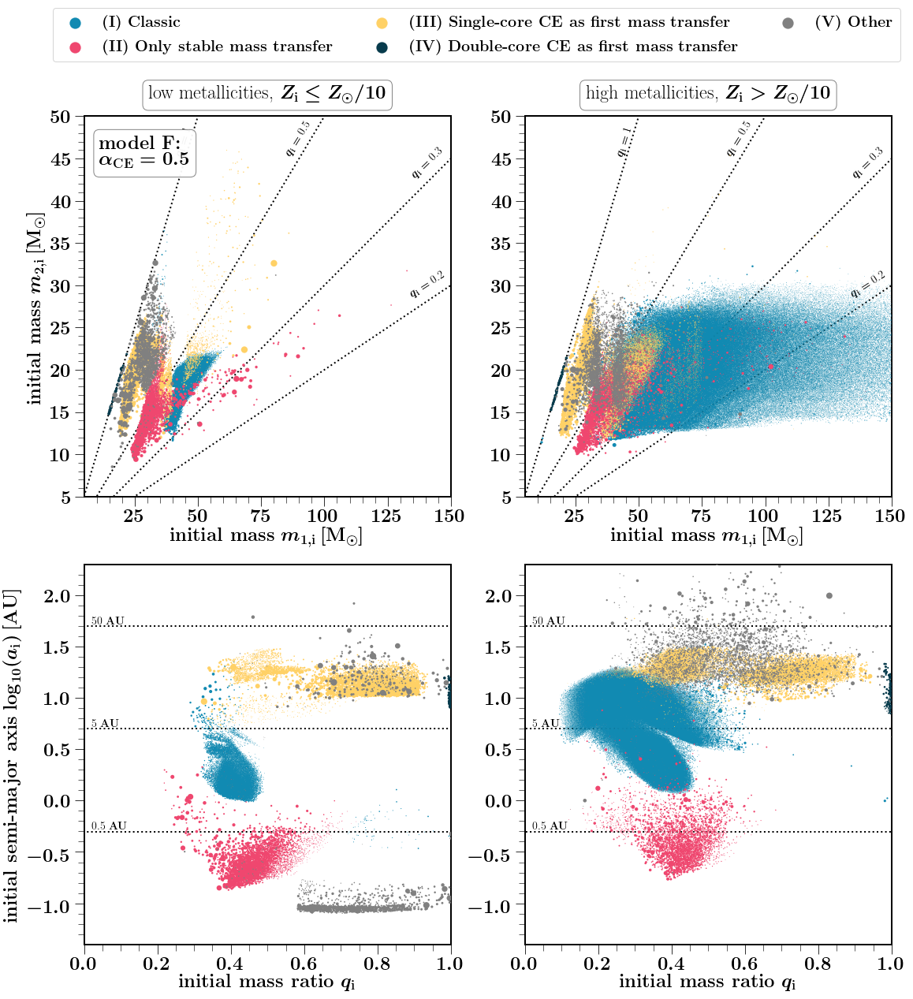

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model G, alpha2_0
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 32681.884618930395
fractional uncertainty on total weight BH-NS = 0.00022046210616187851
percentage uncertainty on total weight BH-NS = 0.02204621061618785 %
STROOPWAFEL gain = 25.501375141543978
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  38.59349196080676
percentage Only stable MT =   3.69410256602244
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 15.053827166976472
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 38.8652241271171
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  3.793354179077224
now making figure
now at z_ind = 0, 
131007 = # BHNS in this sub channel
10384 = # BHNS in this sub channel
148560 = # BHNS in this sub channel
77831 = # BHNS in this sub channel
3884 = # BHNS in this sub channel
now at z_ind = 1, 
363929 = # BHNS in this sub channel
6671 = # BHNS in this sub channel
54670 = # BHNS in this sub channel
35213 = # BHNS in this sub channel
1284 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


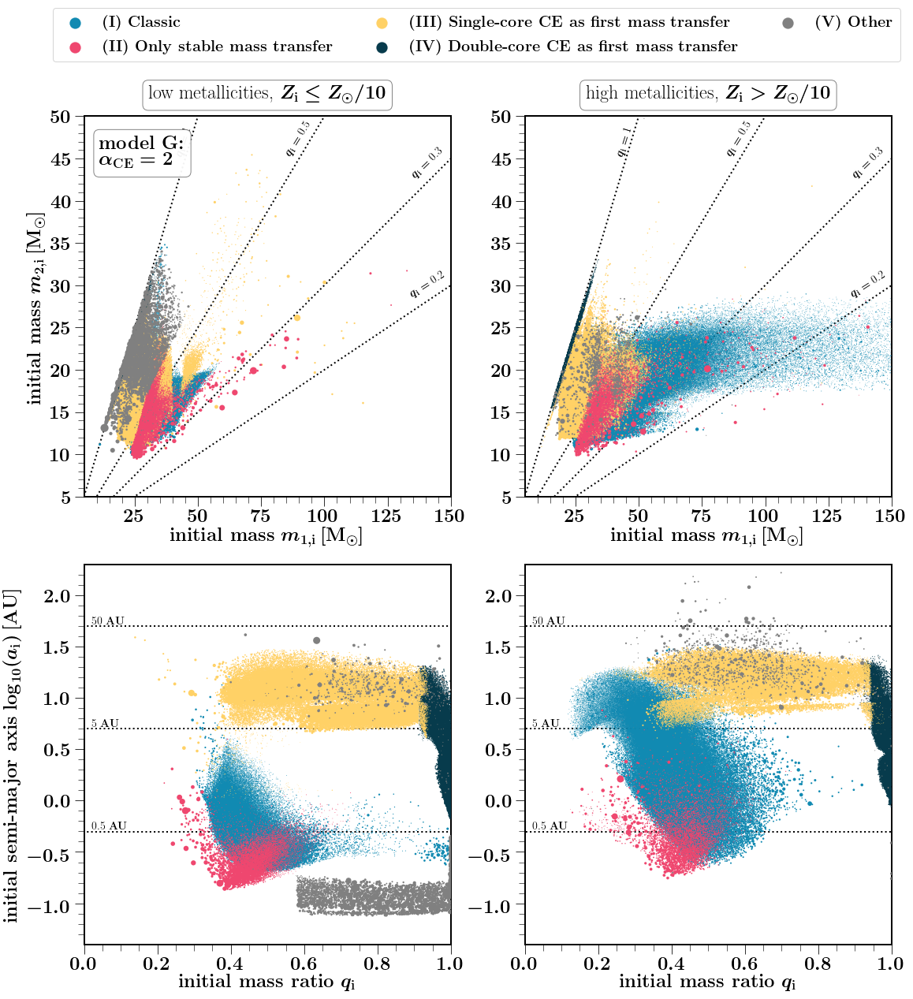

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model H, fiducial
doing optimistic version of fiducial
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 30766.76126800342
fractional uncertainty on total weight BH-NS = 0.0005807514791609477
percentage uncertainty on total weight BH-NS = 0.05807514791609477 %
STROOPWAFEL gain = 49.892869341317414
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  65.1834495788803
percentage Only stable MT =   5.0825080493454005
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 2.537885280006685
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 14.833602766628855
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  29.702572354142415
now making figure
now at z_ind = 0, 
189497 = # BHNS in this sub channel
5959 = # BHNS in this sub channel
23421 = # BHNS in this sub channel
4964 = # BHNS in this sub channel
10156 = # BHNS in this sub channel
now at z_ind = 1, 
1241292 = # BHNS in this sub channel
4749 = # BHNS in this sub channel
41089 = # BHNS in this sub channel
5031 = # BHNS in this sub channel
8884 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


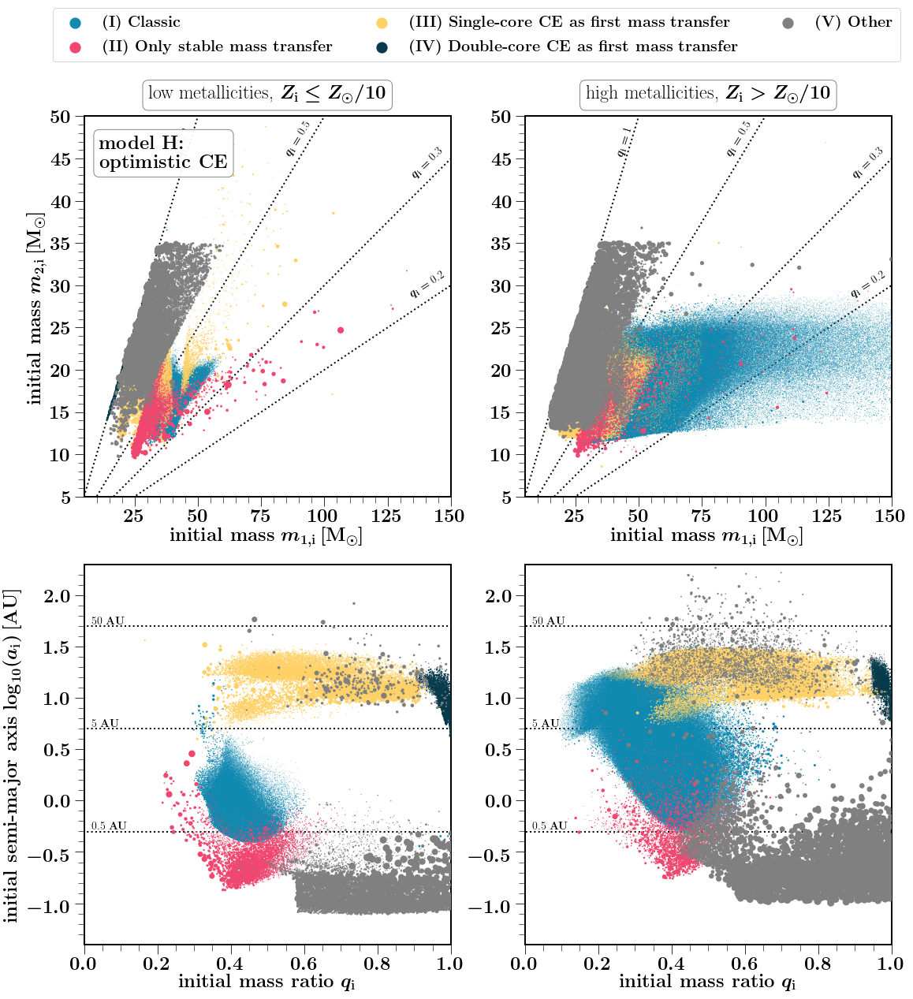

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model I, rapid
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 44797.51183953939
fractional uncertainty on total weight BH-NS = 0.00013789174715674577
percentage uncertainty on total weight BH-NS = 0.013789174715674578 %
STROOPWAFEL gain = 61.75115282984081
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  78.49557258526583
percentage Only stable MT =   2.147644336263067
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 2.2335439149875054
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 14.150022911844456
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  2.973216251639115
now making figure
now at z_ind = 0, 
418657 = # BHNS in this sub channel
8410 = # BHNS in this sub channel
25022 = # BHNS in this sub channel
8976 = # BHNS in this sub channel
4871 = # BHNS in this sub channel
now at z_ind = 1, 
2210097 = # BHNS in this sub channel
9423 = # BHNS in this sub channel
70384 = # BHNS in this sub channel
7793 = # BHNS in this sub channel
2665 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


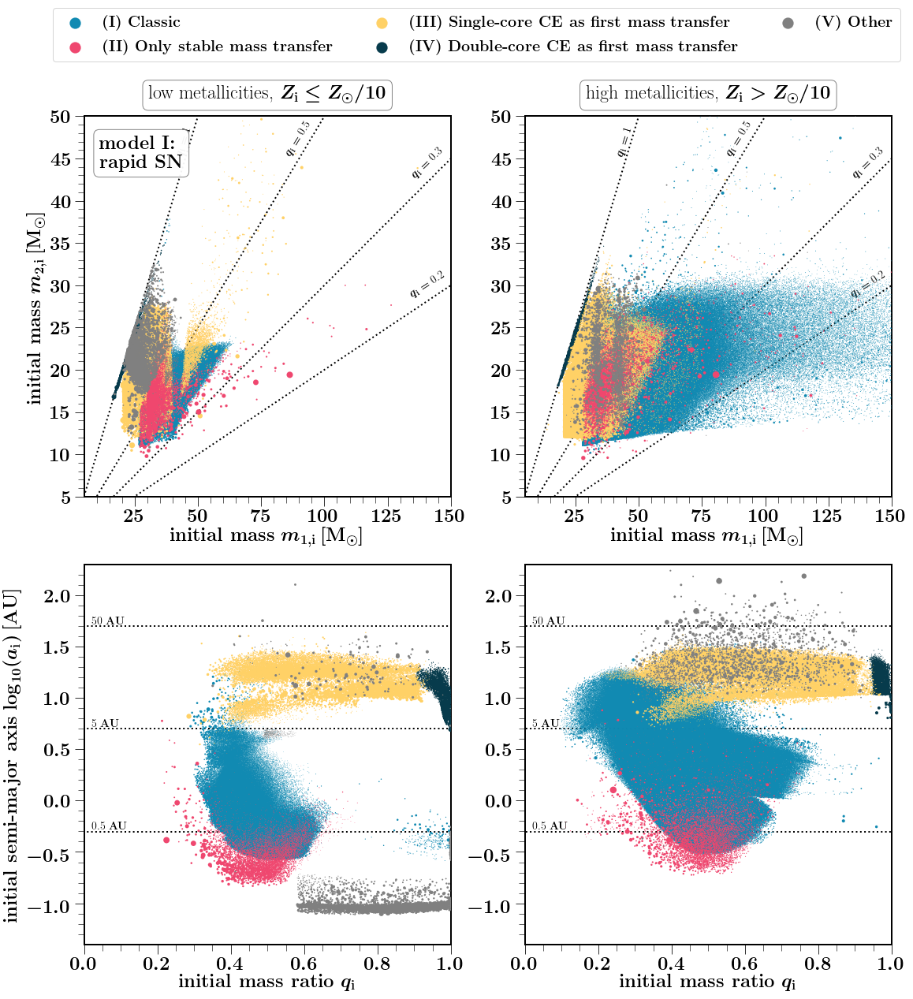

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model J, maxNSmass2_0
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 16474.653555211582
fractional uncertainty on total weight BH-NS = 0.00031527066671447295
percentage uncertainty on total weight BH-NS = 0.03152706667144729 %
STROOPWAFEL gain = 58.25894892317045
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  61.258206207889934
percentage Only stable MT =   5.277699187537142
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 5.68368456318304
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 19.764062205165047
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  8.01634783622484
now making figure
now at z_ind = 0, 
88825 = # BHNS in this sub channel
3932 = # BHNS in this sub channel
15356 = # BHNS in this sub channel
5825 = # BHNS in this sub channel
5051 = # BHNS in this sub channel
now at z_ind = 1, 
799199 = # BHNS in this sub channel
3557 = # BHNS in this sub channel
28478 = # BHNS in this sub channel
6998 = # BHNS in this sub channel
2575 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


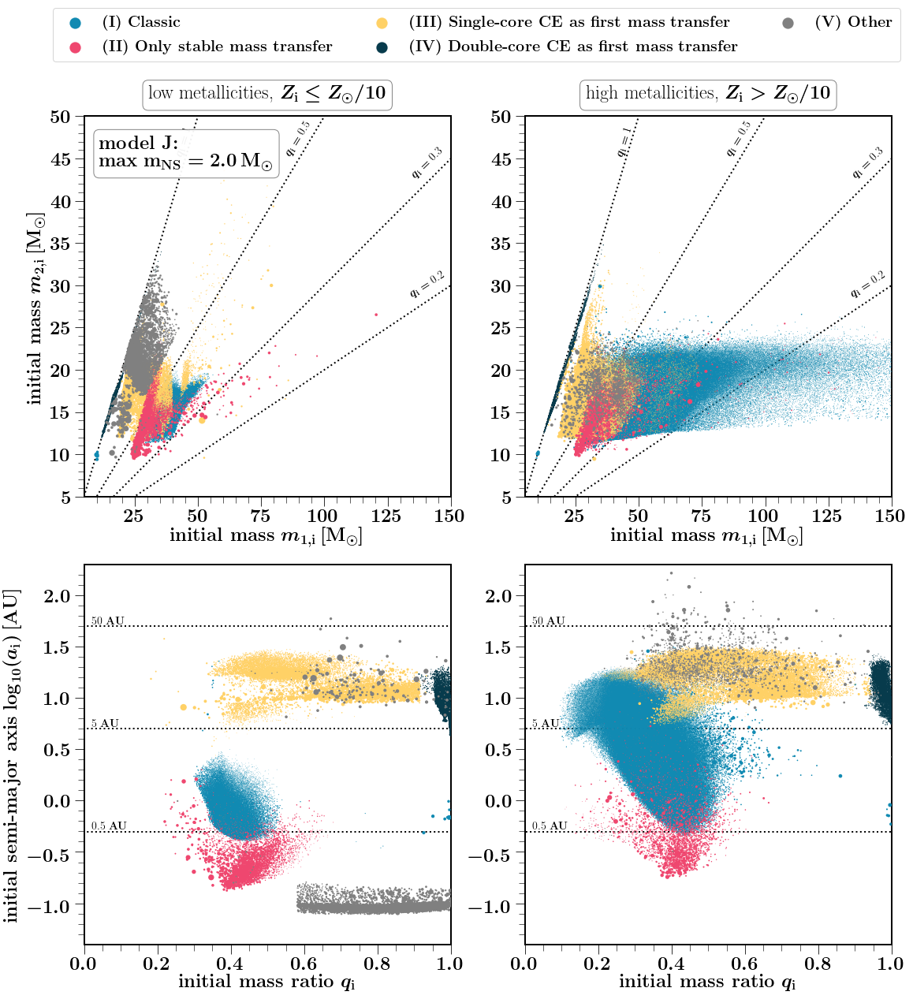

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model K, maxNSmass3_0
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 28903.912232239396
fractional uncertainty on total weight BH-NS = 0.00021014287601810454
percentage uncertainty on total weight BH-NS = 0.021014287601810455 %
STROOPWAFEL gain = 68.86022847038636
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  67.60906547244937
percentage Only stable MT =   4.448019886875478
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 2.871898894946108
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 18.853813533288868
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  6.217202212440149
now making figure
now at z_ind = 0, 
313104 = # BHNS in this sub channel
7747 = # BHNS in this sub channel
29785 = # BHNS in this sub channel
6652 = # BHNS in this sub channel
6189 = # BHNS in this sub channel
now at z_ind = 1, 
1554529 = # BHNS in this sub channel
6048 = # BHNS in this sub channel
54534 = # BHNS in this sub channel
6289 = # BHNS in this sub channel
5453 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


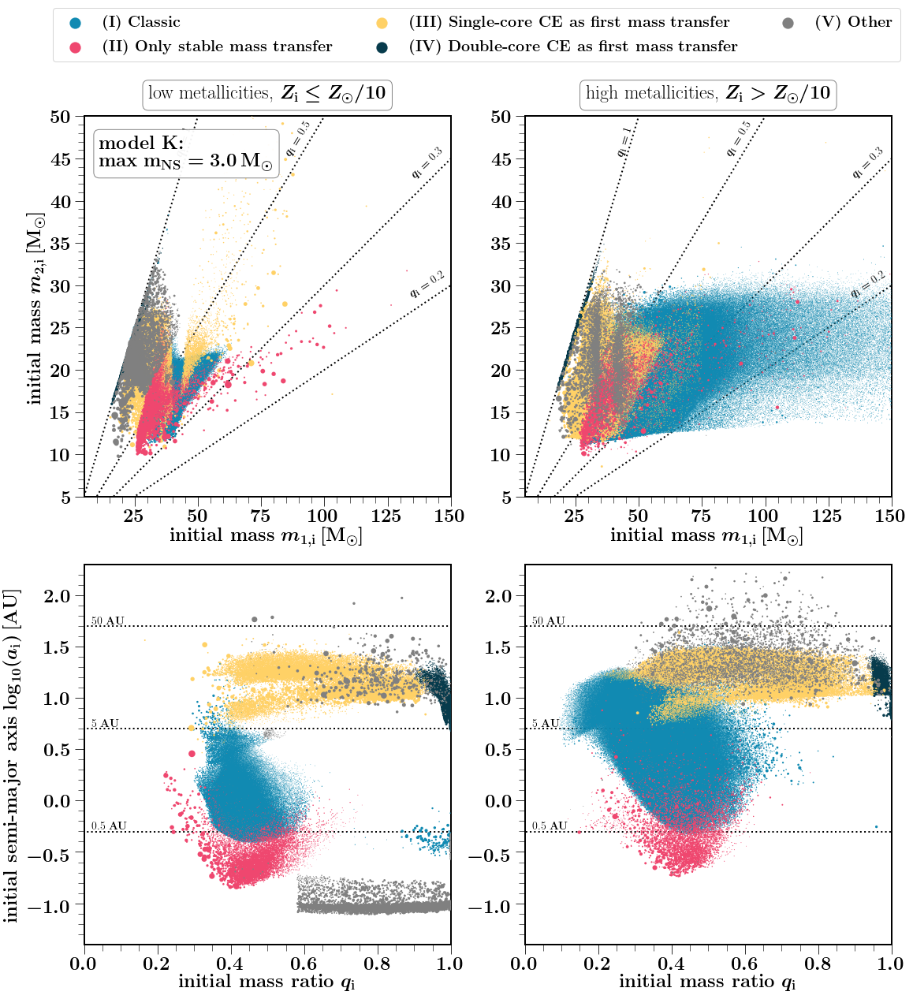

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model L, noPISN
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 23203.987152629205
fractional uncertainty on total weight BH-NS = 0.00025464687600620803
percentage uncertainty on total weight BH-NS = 0.0254646876006208 %
STROOPWAFEL gain = 65.69978641913107
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  65.14532911119612
percentage Only stable MT =   4.982870937578329
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 3.419910476290712
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 19.69668793262212
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  6.755201542312679
now making figure
now at z_ind = 0, 
188664 = # BHNS in this sub channel
5770 = # BHNS in this sub channel
23331 = # BHNS in this sub channel
4970 = # BHNS in this sub channel
5544 = # BHNS in this sub channel
now at z_ind = 1, 
1241223 = # BHNS in this sub channel
4756 = # BHNS in this sub channel
41089 = # BHNS in this sub channel
5050 = # BHNS in this sub channel
4100 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


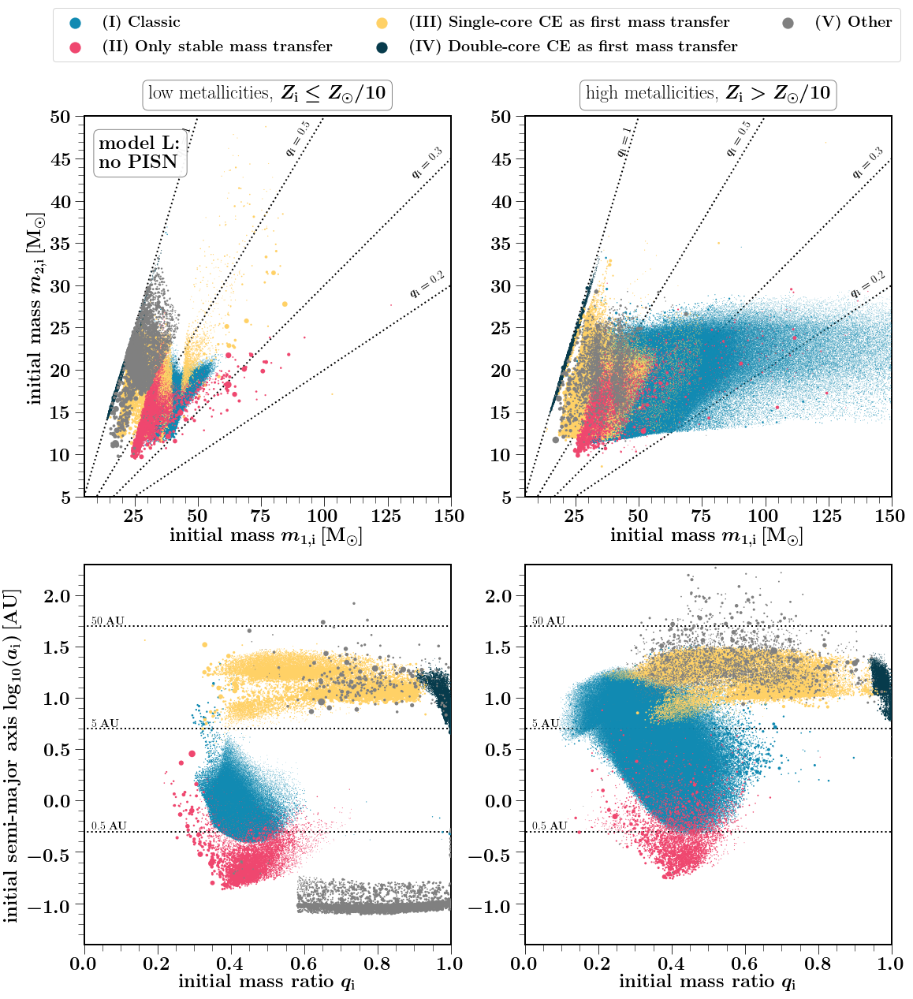

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model M, ccSNkick_100km_s
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 50599.48984710374
fractional uncertainty on total weight BH-NS = 0.00016410942869075066
percentage uncertainty on total weight BH-NS = 0.016410942869075063 %
STROOPWAFEL gain = 60.26657599146818
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  60.900064453896185
percentage Only stable MT =   4.87000427418778
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 2.3047722195741405
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 17.967223417309715
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  13.957935635032149
now making figure
now at z_ind = 0, 
306397 = # BHNS in this sub channel
12523 = # BHNS in this sub channel
56216 = # BHNS in this sub channel
9005 = # BHNS in this sub channel
31556 = # BHNS in this sub channel
now at z_ind = 1, 
2463878 = # BHNS in this sub channel
16770 = # BHNS in this sub channel
121951 = # BHNS in this sub channel
5785 = # BHNS in this sub channel
25377 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


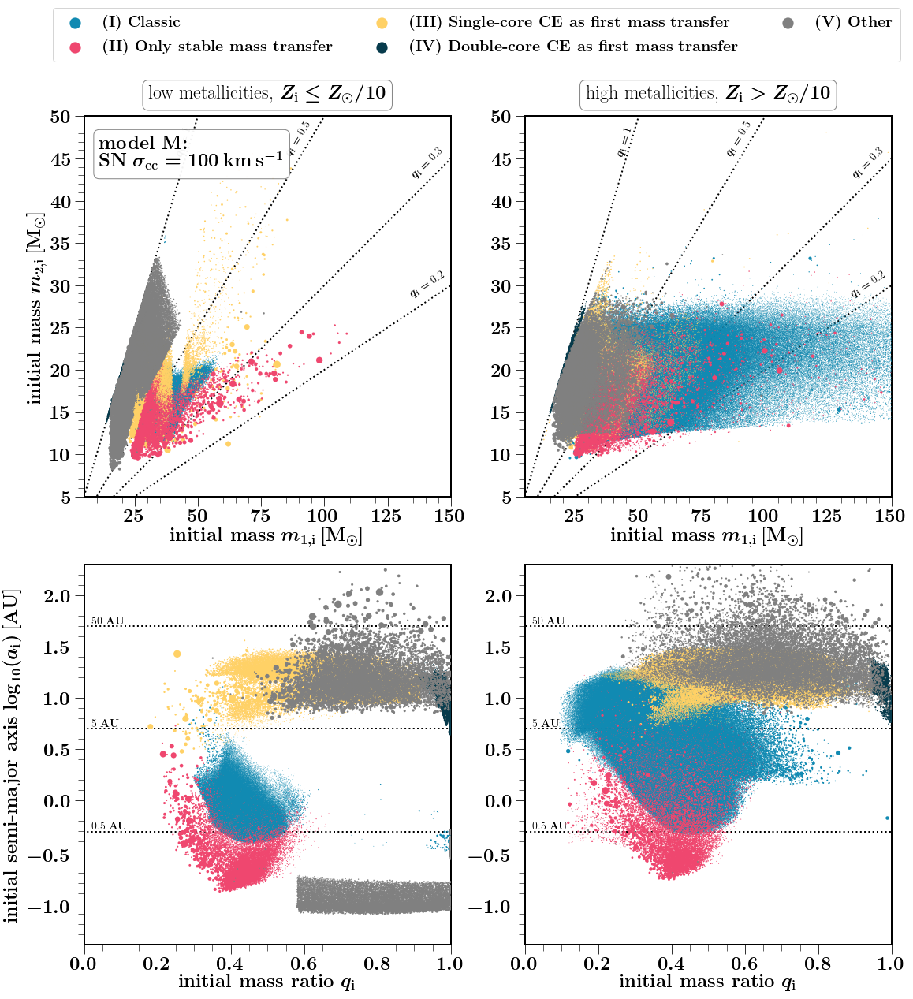

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model N, ccSNkick_30km_s
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 81109.94913932885
fractional uncertainty on total weight BH-NS = 0.0001309942525477067
percentage uncertainty on total weight BH-NS = 0.01309942525477067 %
STROOPWAFEL gain = 51.759840125017966
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  58.04645481299474
percentage Only stable MT =   1.3613340815574757
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 1.4387510729707942
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 11.948706112140714
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  27.204753920336284
now making figure
now at z_ind = 0, 
343375 = # BHNS in this sub channel
4811 = # BHNS in this sub channel
55372 = # BHNS in this sub channel
8944 = # BHNS in this sub channel
141480 = # BHNS in this sub channel
now at z_ind = 1, 
3426640 = # BHNS in this sub channel
3734 = # BHNS in this sub channel
140225 = # BHNS in this sub channel
5560 = # BHNS in this sub channel
68097 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


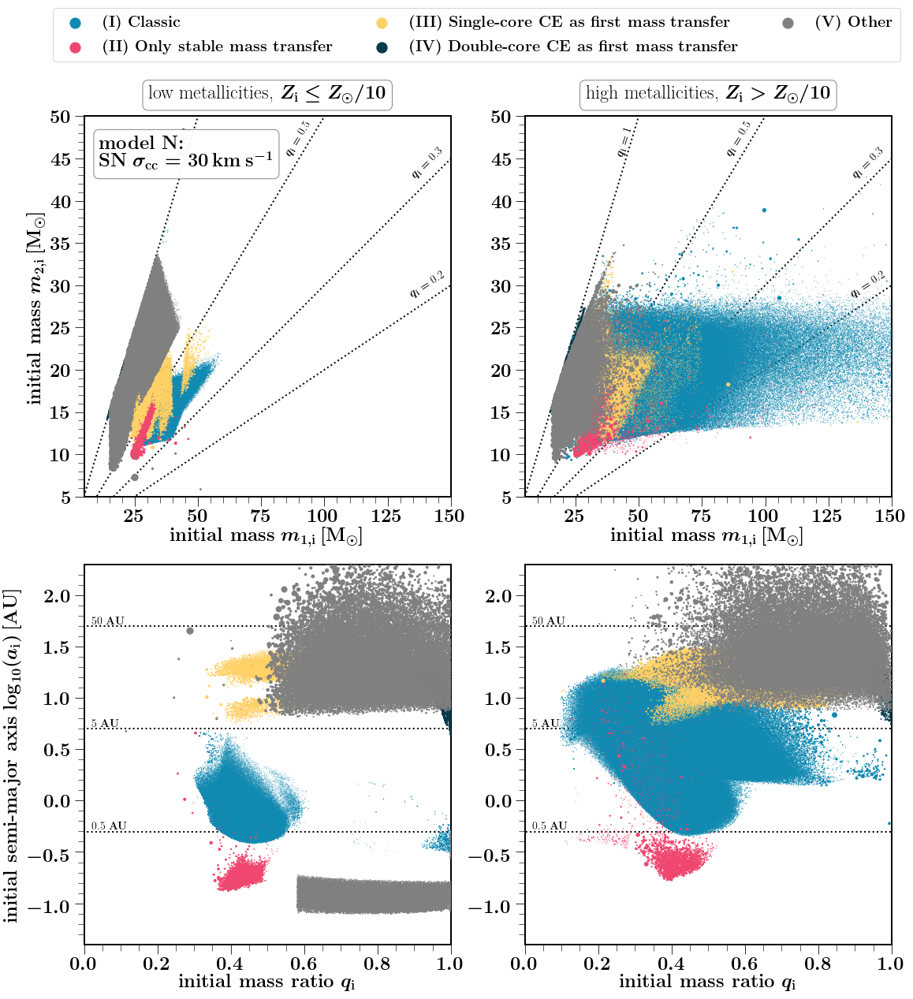

finished, figure is saved in the directory supplementary_material/

-----------------
now doing BPS model O, noBHkick
now getting Data)
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
total weight BHNS mergers in COMPAS simulation = 59861.561359783715
fractional uncertainty on total weight BH-NS = 0.00010411047869149946
percentage uncertainty on total weight BH-NS = 0.010411047869149946 %
STROOPWAFEL gain = 84.6724990939714
now calculating formation channels
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:129: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[maskInterest]


percentage Classic        =  75.93503835796834
percentage Only stable MT =   3.053095073110857
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:377: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage double core CE channel = 1.3094452211876253
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()


../../Scripts/ClassFormationChannels_5mainchannels.py:534: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  seedsRemain       = f['RLOF']['randomSeed'][...].squeeze()[RLOF_Z_MASK][maskInterest]


percentage single core CE channel = 18.077228657346463
weighted samples :-D
Remember to  self.setCOMPASDCOmask() and self.setCOMPASData()
percentage other channel =  1.6251926903868588
now making figure
now at z_ind = 0, 
373831 = # BHNS in this sub channel
8446 = # BHNS in this sub channel
60660 = # BHNS in this sub channel
5418 = # BHNS in this sub channel
5395 = # BHNS in this sub channel
now at z_ind = 1, 
4445622 = # BHNS in this sub channel
12602 = # BHNS in this sub channel
153039 = # BHNS in this sub channel
3446 = # BHNS in this sub channel
169 = # BHNS in this sub channel
now at z_ind = 0


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


now at z_ind = 1


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Using a string of single character colors as a color sequence is deprecated. Use an explicit list instead.


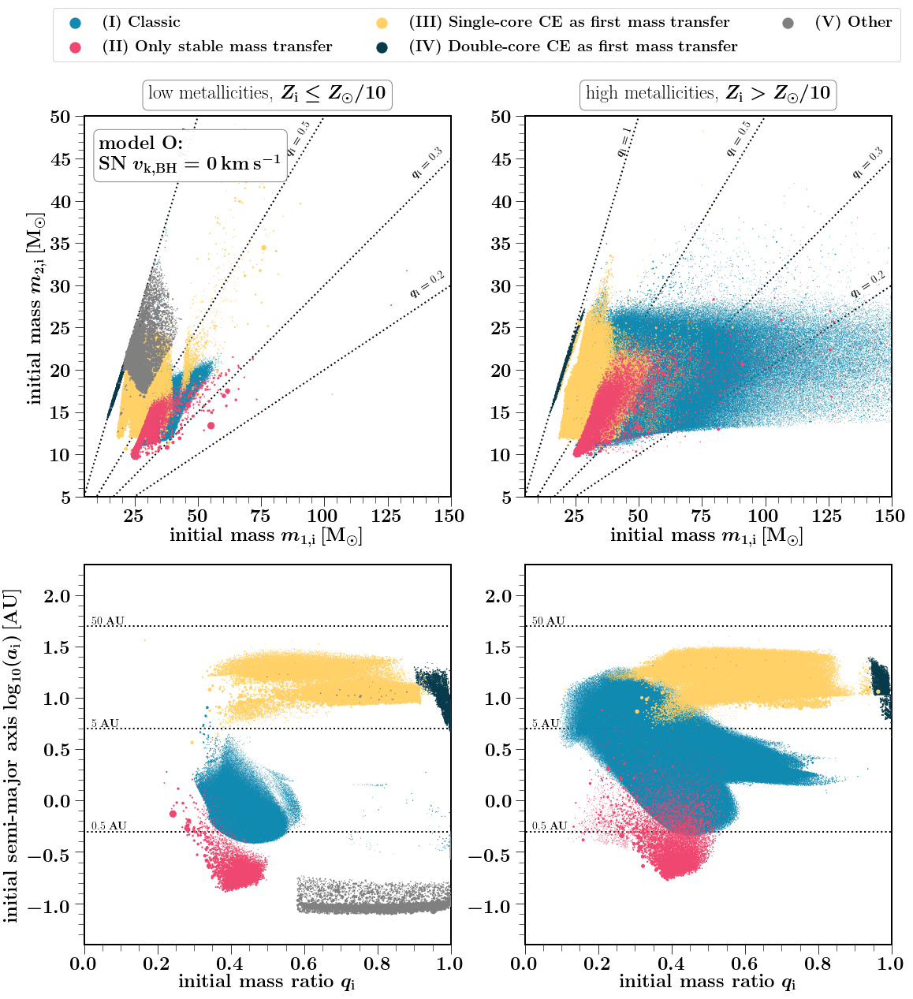

finished, figure is saved in the directory supplementary_material/


In [13]:
mainpath = '/Volumes/Andromeda/DATA/AllDCO_bugfix/'

# I want figure for BHNS binaries
DCOtype='BHNS'


for ind_bps, bps_model in enumerate(BPSnameslist):
    
    
    print()
    print('-----------------')
    print('now doing BPS model %s, %s'%(bps_model, alphabetDirDict[bps_model]))



    
    
    # get fdata from path to this particularly bps file based on how I named the different models
    path = mainpath + str(alphabetDirDict[bps_model]) + '/COMPASCompactOutput_' + DCOtype +'_' + bps_model +'.h5'
    fdata = h5.File(path)


    OPTIMISTIC=False
    if bps_model=='H':
        # only for model H we want optimistic CE selection
        OPTIMISTIC=True
        print('doing optimistic version of fiducial')    

    
    




    ##### Setting DATA file #####
    print('now getting Data)')
    #But I want only within Hubble time 
    Data            = CC.COMPASData(path=path, lazyData=True, Mlower=5., \
                     Mupper=150., binaryFraction=1)
    Data.setCOMPASDCOmask(types=DCOtype,  withinHubbleTime=True, optimistic=OPTIMISTIC)
    Data.setCOMPASData()
    SeedsHubble    = Data.seeds[Data.Hubble==True]




    # calculate the uncertainty on the rate from poisson scatter: 
    print('total weight BHNS mergers in COMPAS simulation =', np.sum(Data.weight))
    rate = np.sum(Data.weight)
    Nzeros = int(53*1E6 - len(Data.weight))
    all_weights = np.concatenate((np.zeros(Nzeros), Data.weight))
    var_rate = np.std(all_weights, ddof=1) * np.sqrt(1E6)

    print('fractional uncertainty on total weight BH-NS =', var_rate/rate)
    print('percentage uncertainty on total weight BH-NS =', 100*var_rate/rate, '%')

    print('STROOPWAFEL gain =', len((Data.weight))/np.sum(Data.weight))

    # metallicities 
    DATAmetallicities = Data.metallicitySystems




    

    ###### CALCULATING FORMATION CHANNELS #########
    print('now calculating formation channels')
    
    # obtain the seeds of the BHNS for each channel

    seedsPercentageClassic, seedsPercentageOnlyStableMT = returnSeedsPercentageClassicAndOnlyStableMT(pathCOMPASOutput=path,\
                                    types=DCOtype,  withinHubbleTime=True, optimistic=False, \
                                    binaryFraction=1)
    seedsClassic, _ = seedsPercentageClassic
    seedsOnlyStableMT, _ = seedsPercentageOnlyStableMT



    seedsDoubleCE,_ = returnSeedsPercentageDoubleCoreCEE(pathCOMPASOutput=path,\
                                    types=DCOtype,  withinHubbleTime=True, optimistic=OPTIMISTIC, \
                                    binaryFraction=1)


    seedsSingleCE, _ = returnSeedsPercentageSingleCoreCEE(pathCOMPASOutput=path,\
                                    types=DCOtype,  withinHubbleTime=True, optimistic=OPTIMISTIC, \
                                    binaryFraction=1)



    seedschannels = [seedsClassic, seedsOnlyStableMT, seedsSingleCE, seedsDoubleCE]

    seedsOther, _ = returnSeedsPercentageOther(pathCOMPASOutput=path,\
                                    types=DCOtype,  withinHubbleTime=True, optimistic=OPTIMISTIC, \
                                    binaryFraction=1, channelsSeedsList=seedschannels)




    dictChannelsBHNS = { 'classic':seedsClassic, \
                        'immediate CE':seedsSingleCE,\
                             'stable B no CEE':seedsOnlyStableMT, \
                         r'double-core CE':seedsDoubleCE,  \
                            'other':seedsOther\
                           }




    LOOP = True

    # Use MSSFR Integrated weights?
    WeightsRateIntrinsic_zIntegrated=False
    if WeightsRateIntrinsic_zIntegrated==False:
        ModelName = 'notMSSFRweighted'

    # multiply weights with this no to obtain scatter point area size
    stimes_weight = 25




    print('now making figure')
  

    f, ax= plt.subplots(ncols=2,nrows=2, figsize=(16,16), 
                      gridspec_kw={"width_ratios":[1.5, 1.5]})




    #### PLOT SEPARATION AND MASS RATIO ###
    xlabel = r'\textbf{initial mass} $m_{1,{\rm{i}}} \, [\rm{M}_{\odot}]$'
    ylabel = r'\textbf{initial mass} $m_{2,{\rm{i}}} \, [\rm{M}_{\odot}]$'


    PlotText = True
    fc=None

    handles, labels = plotInitialMasses(ax=ax[0], fc=fc, Data=Data\
                      , dictRank=dictChannelsBHNS, dictList=dictChannelsBHNSList,channelLabelList=range(8), withinHubble=True)

    lgd2 = f.legend(handles, legendlabel, fontsize=20, ncol=3,\
             bbox_to_anchor=(1.0, 1.1),  markerscale=3., scatterpoints=1) # loc = 'upper center')






    markersize_lgd = 200
    lgd2.legendHandles[0]._sizes = [markersize_lgd]
    lgd2.legendHandles[1]._sizes = [markersize_lgd]
    lgd2.legendHandles[2]._sizes = [markersize_lgd]
    lgd2.legendHandles[3]._sizes = [markersize_lgd]
    lgd2.legendHandles[4]._sizes = [markersize_lgd]



    xlabel = r'\textbf{initial mass ratio} $q_{\rm{i}} $'
    ylabel = r'\textbf{initial semi-major axis} $\log_{10}(a_{\rm{i}}) \, [\rm{AU}]$'




    # whether to plot labels text
    PlotText = False
    handles, labels = plotInitialqVSseparation(ax=ax[1], fc=fc, Data=Data\
                      , dictRank=dictChannelsBHNS, dictList=dictChannelsBHNSList, withinHubble=True)





    #####  ####

    # save and show 
    f.tight_layout(pad=0.4, w_pad=0.5, h_pad=0.5) 
    f.savefig('./supplementary_material/BHNS_InitialParameters_'+ bps_model + '.png', bbox_extra_artists=(lgd2,), bbox_inches='tight', dpi = 600)
    plt.show()
    plt.close()   
    fdata.close() 
    print('finished, figure is saved in the directory supplementary_material/')

